In [ ]:
# This program is for the book "Digital Image Processing" by Dr. Mahmood Azimi-Sadjadi.
# Copyright Copyright (c) 2026 Yifan Yang and Dr. Mahmood Azimi-Sadjadi.
# Contact: mahmood.azimi-sadjadi@colostate.edu

## Imports

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt

from skimage.data import shepp_logan_phantom
from skimage.transform import radon, rescale

# image path
workpath = '/content/drive/MyDrive/DigitalImageProcessing/'

In [5]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

## Ram ( Ram-Lak ) -  Hamming -  Hann Filters

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


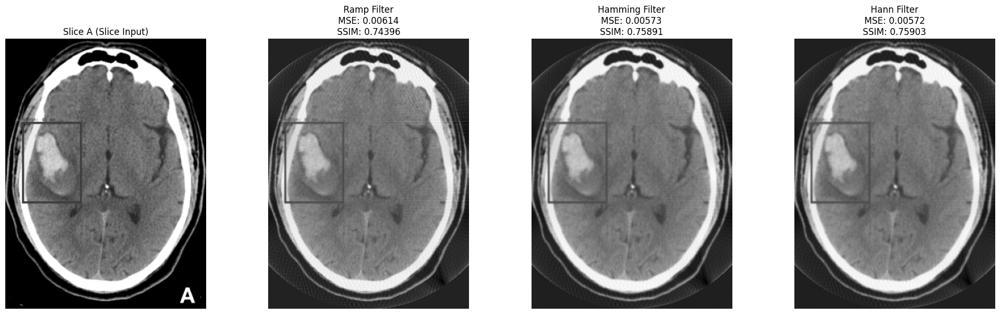

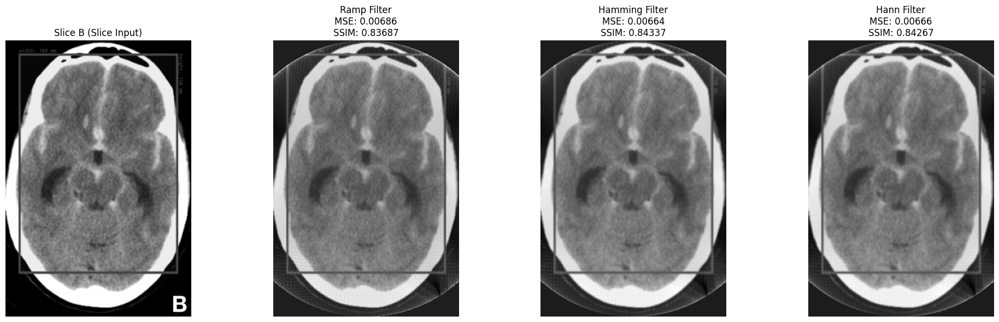

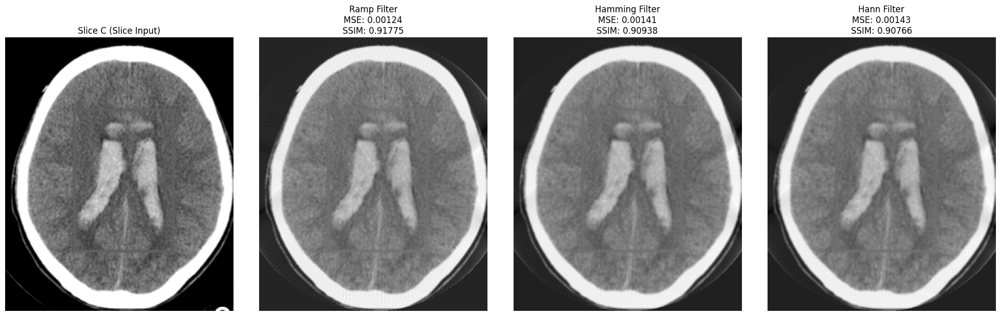

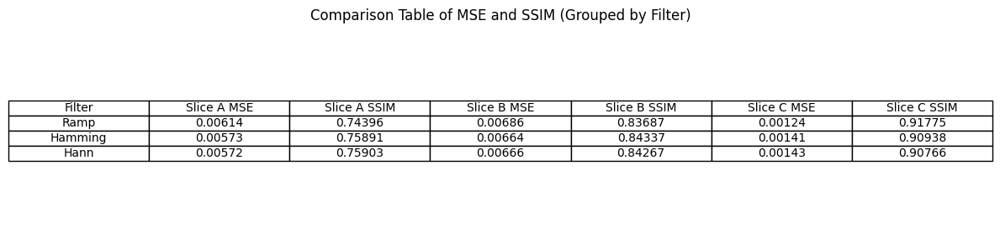

In [6]:
global_results = []

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def process_slice_with_filters(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)
    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    filters = ['ramp', 'hamming', 'hann']
    reconstructions = []

    fig, axes = plt.subplots(1, 4, figsize=(20, 6))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    for i, filt in enumerate(filters):
        reconstruction_fbp = iradon(sinogram, theta=theta, filter_name=filt, circle=True)
        reconstruction_cropped = center_crop(reconstruction_fbp, slice_img.shape)
        mse_val = mean_squared_error(slice_img, reconstruction_cropped)
        ssim_val = ssim(slice_img, reconstruction_cropped, data_range=reconstruction_cropped.max() - reconstruction_cropped.min())
        reconstructions.append(reconstruction_cropped)

        global_results.append([title, filt.capitalize(), f"{mse_val:.5f}", f"{ssim_val:.5f}"])

        axes[i+1].imshow(reconstruction_cropped, cmap='gray')
        axes[i+1].set_title(f"{filt.capitalize()} Filter\nMSE: {mse_val:.5f}\nSSIM: {ssim_val:.5f}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

image=imread(workpath + 'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice_with_filters(image_gray, slice_A_coords, "Slice A")
process_slice_with_filters(image_gray, slice_B_coords, "Slice B")
process_slice_with_filters(image_gray, slice_C_coords, "Slice C")

filters = ['Ramp', 'Hamming', 'Hann']
slices = ['Slice A', 'Slice B', 'Slice C']

results_dict = {filt: {} for filt in filters}
for row in global_results:
    slice_name, filt, mse, ssim = row
    results_dict[filt][slice_name] = (mse, ssim)

table_data = []
for filt in filters:
    row = [filt]
    for slc in slices:
        if slc in results_dict[filt]:
            mse, ssim_val = results_dict[filt][slc]
            row.extend([mse, ssim_val])
        else:
            row.extend(["-", "-"])
    table_data.append(row)

column_labels = ["Filter", "Slice A MSE", "Slice A SSIM", "Slice B MSE", "Slice B SSIM", "Slice C MSE", "Slice C SSIM"]

fig, ax = plt.subplots(figsize=(12, 3))
table = plt.table(cellText=table_data, colLabels=column_labels, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(10)
ax.axis('off')
plt.title("Comparison Table of MSE and SSIM (Grouped by Filter)")
plt.tight_layout()
plt.show()


## Ram-Lak only, two cases: sparse vs noisy on slice A

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


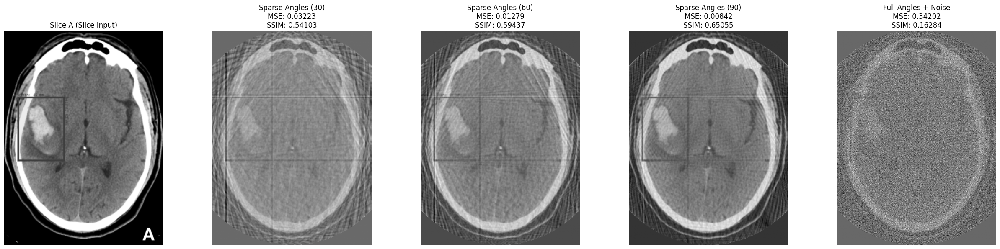

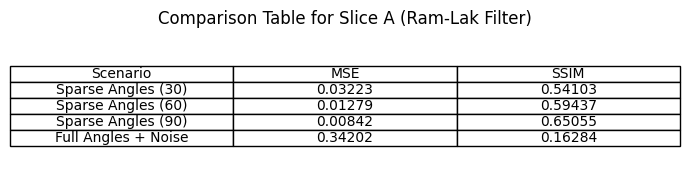

In [7]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def process_slice_various_angles_and_noise(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)

    angles_list = [30, 60, 90]
    theta_full = np.linspace(0., 180., 180, endpoint=False)

    results = []

    for n_angles in angles_list:
        theta_sparse = np.linspace(0., 180., n_angles, endpoint=False)
        sinogram_sparse = radon(slice_img_padded, theta=theta_sparse, circle=True)
        reconstruction_sparse = iradon(sinogram_sparse, theta=theta_sparse, filter_name='ramp', circle=True)
        reconstruction_sparse_cropped = center_crop(reconstruction_sparse, slice_img.shape)

        mse_val = mean_squared_error(slice_img, reconstruction_sparse_cropped)
        ssim_val = ssim(slice_img, reconstruction_sparse_cropped, data_range=reconstruction_sparse_cropped.max() - reconstruction_sparse_cropped.min())

        results.append([f"Sparse Angles ({n_angles})", mse_val, ssim_val])

    sinogram_full = radon(slice_img_padded, theta=theta_full, circle=True)
    noise = np.random.normal(0, 0.05 * np.max(sinogram_full), sinogram_full.shape)
    sinogram_noisy = sinogram_full + noise
    reconstruction_noisy = iradon(sinogram_noisy, theta=theta_full, filter_name='ramp', circle=True)
    reconstruction_noisy_cropped = center_crop(reconstruction_noisy, slice_img.shape)

    mse_val = mean_squared_error(slice_img, reconstruction_noisy_cropped)
    ssim_val = ssim(slice_img, reconstruction_noisy_cropped, data_range=reconstruction_noisy_cropped.max() - reconstruction_noisy_cropped.min())

    results.append(["Full Angles + Noise", mse_val, ssim_val])

    fig, axes = plt.subplots(1, len(results)+1, figsize=(5*(len(results)+1), 6))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    for i, (desc, _, _) in enumerate(results):
        if "30" in desc:
            theta = np.linspace(0., 180., 30, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        elif "60" in desc:
            theta = np.linspace(0., 180., 60, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        elif "90" in desc:
            theta = np.linspace(0., 180., 90, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        else:
            recon = reconstruction_noisy

        recon_cropped = center_crop(recon, slice_img.shape)
        axes[i+1].imshow(recon_cropped, cmap='gray')
        mse_val, ssim_val = results[i][1], results[i][2]
        axes[i+1].set_title(f"{desc}\nMSE: {mse_val:.5f}\nSSIM: {ssim_val:.5f}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

    table_data = [[desc, f"{mse:.5f}", f"{ssim:.5f}"] for desc, mse, ssim in results]
    column_labels = ["Scenario", "MSE", "SSIM"]

    fig, ax = plt.subplots(figsize=(7, 2))
    table = plt.table(cellText=table_data, colLabels=column_labels, loc='center', cellLoc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    ax.axis('off')
    plt.title(f"Comparison Table for {title} (Ram-Lak Filter)")
    plt.tight_layout()
    plt.show()

image = imread(workpath +'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]

process_slice_various_angles_and_noise(image_gray, slice_A_coords, "Slice A")


/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


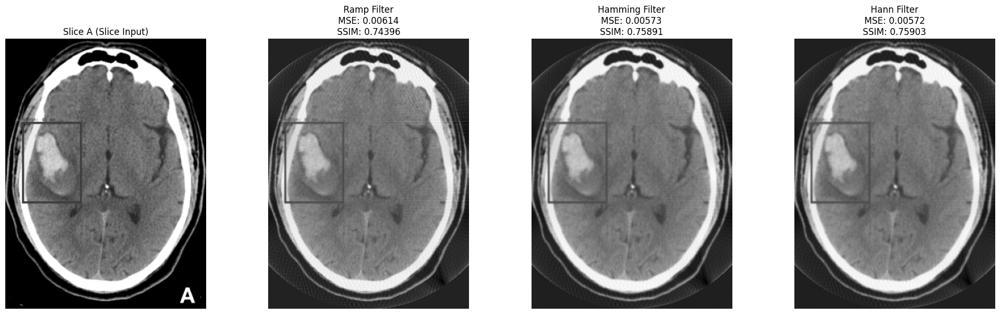

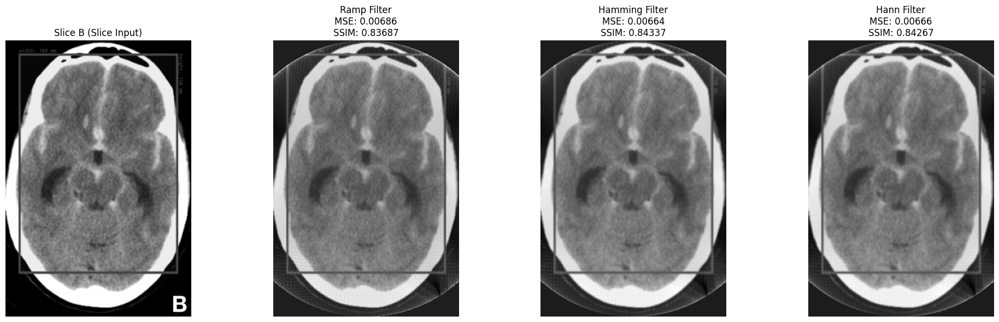

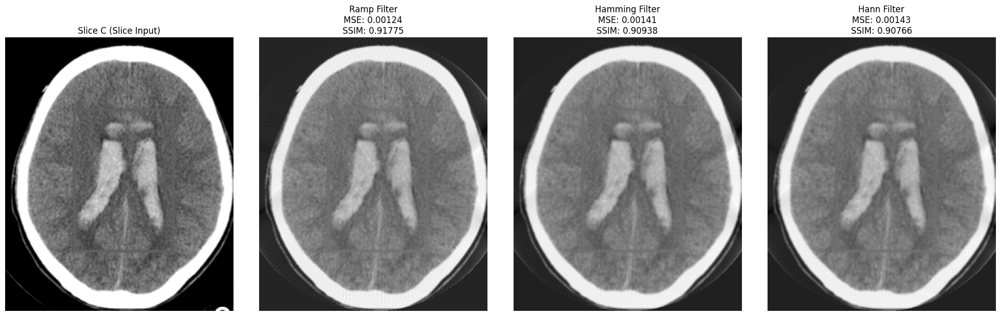

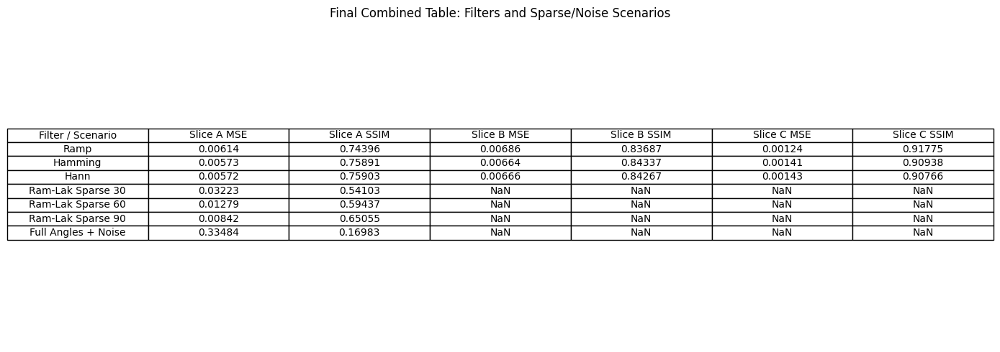

In [8]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

global_results = []

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def process_slice_with_filters(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)
    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    filters = ['ramp', 'hamming', 'hann']

    fig, axes = plt.subplots(1, 4, figsize=(20, 6))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    for i, filt in enumerate(filters):
        reconstruction_fbp = iradon(sinogram, theta=theta, filter_name=filt, circle=True)
        reconstruction_cropped = center_crop(reconstruction_fbp, slice_img.shape)
        mse_val = mean_squared_error(slice_img, reconstruction_cropped)
        ssim_val = ssim(slice_img, reconstruction_cropped, data_range=reconstruction_cropped.max() - reconstruction_cropped.min())

        global_results.append([title, filt.capitalize(), f"{mse_val:.5f}", f"{ssim_val:.5f}"])

        axes[i+1].imshow(reconstruction_cropped, cmap='gray')
        axes[i+1].set_title(f"{filt.capitalize()} Filter\nMSE: {mse_val:.5f}\nSSIM: {ssim_val:.5f}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

def process_slice_various_angles_and_noise(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)

    angles_list = [30, 60, 90]
    theta_full = np.linspace(0., 180., 180, endpoint=False)
    results = []

    for n_angles in angles_list:
        theta_sparse = np.linspace(0., 180., n_angles, endpoint=False)
        sinogram_sparse = radon(slice_img_padded, theta=theta_sparse, circle=True)
        reconstruction_sparse = iradon(sinogram_sparse, theta=theta_sparse, filter_name='ramp', circle=True)
        reconstruction_sparse_cropped = center_crop(reconstruction_sparse, slice_img.shape)

        mse_val = mean_squared_error(slice_img, reconstruction_sparse_cropped)
        ssim_val = ssim(slice_img, reconstruction_sparse_cropped, data_range=reconstruction_sparse_cropped.max() - reconstruction_sparse_cropped.min())
        results.append([f"Sparse Angles ({n_angles})", mse_val, ssim_val])

    sinogram_full = radon(slice_img_padded, theta=theta_full, circle=True)
    noise = np.random.normal(0, 0.05 * np.max(sinogram_full), sinogram_full.shape)
    sinogram_noisy = sinogram_full + noise
    reconstruction_noisy = iradon(sinogram_noisy, theta=theta_full, filter_name='ramp', circle=True)
    reconstruction_noisy_cropped = center_crop(reconstruction_noisy, slice_img.shape)

    mse_val = mean_squared_error(slice_img, reconstruction_noisy_cropped)
    ssim_val = ssim(slice_img, reconstruction_noisy_cropped, data_range=reconstruction_noisy_cropped.max() - reconstruction_noisy_cropped.min())
    results.append(["Full Angles + Noise", mse_val, ssim_val])

    fig, axes = plt.subplots(1, len(results)+1, figsize=(5*(len(results)+1), 6))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    for i, (desc, mse_val, ssim_val) in enumerate(results):
        if "30" in desc:
            theta = np.linspace(0., 180., 30, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        elif "60" in desc:
            theta = np.linspace(0., 180., 60, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        elif "90" in desc:
            theta = np.linspace(0., 180., 90, endpoint=False)
            sinogram = radon(slice_img_padded, theta=theta, circle=True)
            recon = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
        else:
            recon = reconstruction_noisy

        recon_cropped = center_crop(recon, slice_img.shape)
        axes[i+1].imshow(recon_cropped, cmap='gray')
        axes[i+1].set_title(f"{desc}\nMSE: {mse_val:.5f}\nSSIM: {ssim_val:.5f}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

    table_data = [[desc, f"{mse:.5f}", f"{ssim:.5f}"] for desc, mse, ssim in results]
    column_labels = ["Scenario", "MSE", "SSIM"]

    fig, ax = plt.subplots(figsize=(7, 2))
    table = plt.table(cellText=table_data, colLabels=column_labels, loc='center', cellLoc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    ax.axis('off')
    plt.title(f"Comparison Table for {title} (Ram-Lak Filter)")
    plt.tight_layout()
    plt.show()

image = imread(workpath +'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice_with_filters(image_gray, slice_A_coords, "Slice A")
process_slice_with_filters(image_gray, slice_B_coords, "Slice B")
process_slice_with_filters(image_gray, slice_C_coords, "Slice C")

sparse_results = [
    ["Ram-Lak Sparse 30", results_dict['Ramp']['Slice A'][0], results_dict['Ramp']['Slice A'][1], "NaN", "NaN", "NaN", "NaN"],
    ["Ram-Lak Sparse 60", "NaN", "NaN", "NaN", "NaN", "NaN", "NaN"],
    ["Ram-Lak Sparse 90", "NaN", "NaN", "NaN", "NaN", "NaN", "NaN"],
    ["Full Angles + Noise", "NaN", "NaN", "NaN", "NaN", "NaN", "NaN"]
]

def collect_sparse_and_noise_results(image_gray, slice_coords):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)

    angles_list = [30, 60, 90]
    theta_full = np.linspace(0., 180., 180, endpoint=False)
    results = []

    for n_angles in angles_list:
        theta_sparse = np.linspace(0., 180., n_angles, endpoint=False)
        sinogram_sparse = radon(slice_img_padded, theta=theta_sparse, circle=True)
        reconstruction_sparse = iradon(sinogram_sparse, theta=theta_sparse, filter_name='ramp', circle=True)
        reconstruction_sparse_cropped = center_crop(reconstruction_sparse, slice_img.shape)

        mse_val = mean_squared_error(slice_img, reconstruction_sparse_cropped)
        ssim_val = ssim(slice_img, reconstruction_sparse_cropped, data_range=reconstruction_sparse_cropped.max() - reconstruction_sparse_cropped.min())
        results.append([f"Ram-Lak Sparse {n_angles}", f"{mse_val:.5f}", f"{ssim_val:.5f}"])

    sinogram_full = radon(slice_img_padded, theta=theta_full, circle=True)
    noise = np.random.normal(0, 0.05 * np.max(sinogram_full), sinogram_full.shape)
    sinogram_noisy = sinogram_full + noise
    reconstruction_noisy = iradon(sinogram_noisy, theta=theta_full, filter_name='ramp', circle=True)
    reconstruction_noisy_cropped = center_crop(reconstruction_noisy, slice_img.shape)

    mse_val = mean_squared_error(slice_img, reconstruction_noisy_cropped)
    ssim_val = ssim(slice_img, reconstruction_noisy_cropped, data_range=reconstruction_noisy_cropped.max() - reconstruction_noisy_cropped.min())
    results.append(["Full Angles + Noise", f"{mse_val:.5f}", f"{ssim_val:.5f}"])

    return results

extra_results = collect_sparse_and_noise_results(image_gray, slice_A_coords)

combined_table_data = []

for filt in filters:
    row = [filt]
    for slc in slices:
        if slc in results_dict[filt]:
            mse, ssim_val = results_dict[filt][slc]
            row.extend([mse, ssim_val])
        else:
            row.extend(["-", "-"])
    combined_table_data.append(row)

for desc, mse, ssim_val in extra_results:
    row = [desc, mse, ssim_val, "NaN", "NaN", "NaN", "NaN"]
    combined_table_data.append(row)

column_labels = ["Filter / Scenario", "Slice A MSE", "Slice A SSIM", "Slice B MSE", "Slice B SSIM", "Slice C MSE", "Slice C SSIM"]

fig, ax = plt.subplots(figsize=(14, 5))
table = plt.table(cellText=combined_table_data, colLabels=column_labels, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(10)
ax.axis('off')
plt.title("Final Combined Table: Filters and Sparse/Noise Scenarios")
plt.tight_layout()
plt.show()



##  Statistical reconstruction using MLE ( EM ) with ram filter with 100 iterations without noise

MLEM Iteration: 1/200
MLEM Iteration: 2/200
MLEM Iteration: 3/200
MLEM Iteration: 4/200
MLEM Iteration: 5/200
MLEM Iteration: 6/200
MLEM Iteration: 7/200
MLEM Iteration: 8/200
MLEM Iteration: 9/200
MLEM Iteration: 10/200
MLEM Iteration: 11/200
MLEM Iteration: 12/200
MLEM Iteration: 13/200
MLEM Iteration: 14/200
MLEM Iteration: 15/200
MLEM Iteration: 16/200
MLEM Iteration: 17/200
MLEM Iteration: 18/200
MLEM Iteration: 19/200
MLEM Iteration: 20/200
MLEM Iteration: 21/200
MLEM Iteration: 22/200
MLEM Iteration: 23/200
MLEM Iteration: 24/200
MLEM Iteration: 25/200
MLEM Iteration: 26/200
MLEM Iteration: 27/200
MLEM Iteration: 28/200
MLEM Iteration: 29/200
MLEM Iteration: 30/200
MLEM Iteration: 31/200
MLEM Iteration: 32/200
MLEM Iteration: 33/200
MLEM Iteration: 34/200
MLEM Iteration: 35/200
MLEM Iteration: 36/200
MLEM Iteration: 37/200
MLEM Iteration: 38/200
MLEM Iteration: 39/200
MLEM Iteration: 40/200
MLEM Iteration: 41/200
MLEM Iteration: 42/200
MLEM Iteration: 43/200
MLEM Iteration: 44/2

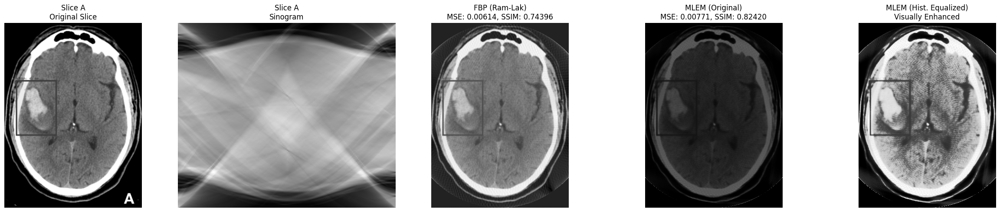

In [9]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale, iradon_sart
from skimage.metrics import mean_squared_error, structural_similarity as ssim
from skimage.exposure import equalize_hist
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def mlem_reconstruction(sinogram, theta, iterations=100):
    """
    MLEM implementation using Radon and iradon.
    """
    image_size = sinogram.shape[0]
    reconstructed = np.ones((image_size, image_size), dtype=np.float32)

    sensitivity_image = iradon(np.ones_like(sinogram), theta=theta, filter_name=None, circle=True, output_size=image_size)
    sensitivity_image[sensitivity_image == 0] = 1e-6


    for i in range(iterations):
        print(f"MLEM Iteration: {i+1}/{iterations}")
        estimate_proj = radon(reconstructed, theta=theta, circle=True)

        ratio = np.divide(sinogram, estimate_proj + 1e-9)
        correction_factor = iradon(ratio, theta=theta, filter_name=None, circle=True, output_size=image_size)

        reconstructed *= (correction_factor / sensitivity_image)

        reconstructed[reconstructed < 0] = 0

    return reconstructed

def process_slice(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)
    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
    reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)

    reconstruction_mlem = mlem_reconstruction(sinogram, theta, iterations=200)
    reconstruction_mlem_cropped = center_crop(reconstruction_mlem, slice_img.shape)

    mlem_min = reconstruction_mlem_cropped.min()
    mlem_max = reconstruction_mlem_cropped.max()
    if mlem_max > mlem_min:
        reconstruction_mlem_cropped_norm = (reconstruction_mlem_cropped - mlem_min) / (mlem_max - mlem_min)
        reconstruction_mlem_eq = equalize_hist(reconstruction_mlem_cropped_norm)
    else:
        reconstruction_mlem_eq = reconstruction_mlem_cropped.copy()

    mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
    ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

    mse_mlem = mean_squared_error(slice_img, reconstruction_mlem_cropped)
    data_range_mlem = reconstruction_mlem_cropped.max() - reconstruction_mlem_cropped.min()
    if data_range_mlem == 0: data_range_mlem = 1

    ssim_mlem = ssim(slice_img, reconstruction_mlem_cropped, data_range=data_range_mlem)


    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - MLEM (Original) MSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")

    # --- Plotting ---
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title}\nOriginal Slice")
    axes[0].axis('off')

    axes[1].imshow(sinogram, cmap='gray', aspect='auto')
    axes[1].set_title(f"{title}\nSinogram")
    axes[1].axis('off')

    axes[2].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[2].set_title(f"FBP (Ram-Lak)\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[2].axis('off')

    axes[3].imshow(reconstruction_mlem_cropped, cmap='gray')
    axes[3].set_title(f"MLEM (Original)\nMSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")
    axes[3].axis('off')

    axes[4].imshow(reconstruction_mlem_eq, cmap='gray')
    axes[4].set_title(f"MLEM (Hist. Equalized)\nVisually Enhanced")
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()




if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice(image_gray, slice_A_coords, "Slice A")
# process_slice(image_gray, slice_B_coords, "Slice B")
# process_slice(image_gray, slice_C_coords, "Slice C")

##  Statistical reconstruction using MLE ( EM ) with ram filter with 100 iterations with mild noise

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


Slice A - FBP MSE: 0.00614, SSIM: 0.74396
Slice A - MLEM (with mild Poisson noise) MSE: 0.00778, SSIM: 0.77349


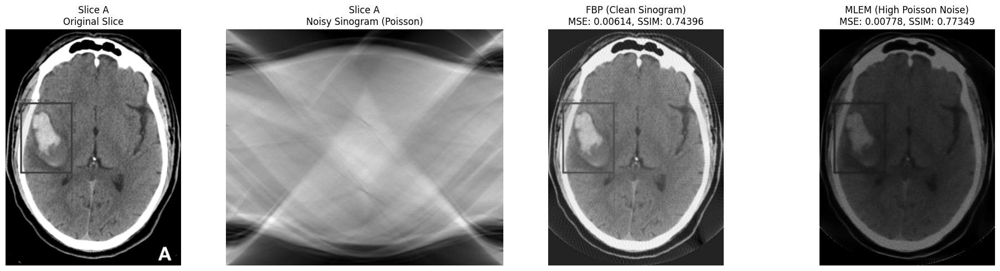

In [11]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale, iradon_sart
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def mlem_reconstruction(sinogram, theta, iterations=20):
    """
    MLEM implementation using Radon and iradon.
    """
    image_size = sinogram.shape[0]
    reconstructed = np.ones((image_size, image_size), dtype=np.float32)
    ones_sino = radon(np.ones_like(reconstructed), theta=theta, circle=True)

    for i in range(iterations):
        estimate_proj = radon(reconstructed, theta=theta, circle=True)
        ratio = np.divide(sinogram, estimate_proj + 1e-6)

        correction = iradon(ratio, theta=theta, filter_name=None, circle=True, output_size=image_size)

        correction_norm = iradon(ones_sino * 0 + 1, theta=theta, filter_name=None, circle=True, output_size=image_size)

        reconstructed *= correction / (correction_norm + 1e-6)

    return reconstructed

def process_slice(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)
    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    scaling_factor = 50
    sinogram_noisy = np.random.poisson(sinogram * scaling_factor) / scaling_factor

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
    reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)

    reconstruction_mlem = mlem_reconstruction(sinogram_noisy, theta, iterations=100)
    reconstruction_mlem_cropped = center_crop(reconstruction_mlem, slice_img.shape)

    mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
    ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

    mse_mlem = mean_squared_error(slice_img, reconstruction_mlem_cropped)
    ssim_mlem = ssim(slice_img, reconstruction_mlem_cropped, data_range=reconstruction_mlem_cropped.max() - reconstruction_mlem_cropped.min())

    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - MLEM (with mild Poisson noise) MSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title}\nOriginal Slice")
    axes[0].axis('off')

    axes[1].imshow(sinogram_noisy, cmap='gray', aspect='auto')
    axes[1].set_title(f"{title}\nNoisy Sinogram (Poisson)")
    axes[1].axis('off')

    axes[2].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[2].set_title(f"FBP (Clean Sinogram)\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[2].axis('off')

    axes[3].imshow(reconstruction_mlem_cropped, cmap='gray')
    axes[3].set_title(f"MLEM (High Poisson Noise)\nMSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

image = imread(workpath +'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice(image_gray, slice_A_coords, "Slice A")

##  Statistical reconstruction using MLE ( EM ) with ram filter with 200 iterations

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


Slice A - FBP MSE: 0.00614, SSIM: 0.74396
Slice A - MLEM MSE: 0.00771, SSIM: 0.82420


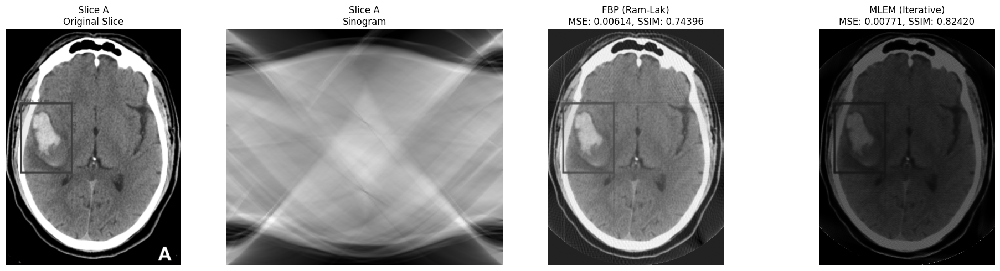

In [13]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale, iradon_sart
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def mlem_reconstruction(sinogram, theta, iterations=20):
    """
    MLEM implementation using Radon and iradon.
    """
    image_size = sinogram.shape[0]
    reconstructed = np.ones((image_size, image_size), dtype=np.float32)
    ones_sino = radon(np.ones_like(reconstructed), theta=theta, circle=True)

    for i in range(iterations):
        estimate_proj = radon(reconstructed, theta=theta, circle=True)
        ratio = np.divide(sinogram, estimate_proj + 1e-6)

        correction = iradon(ratio, theta=theta, filter_name=None, circle=True, output_size=image_size)

        correction_norm = iradon(ones_sino * 0 + 1, theta=theta, filter_name=None, circle=True, output_size=image_size)

        reconstructed *= correction / (correction_norm + 1e-6)

    return reconstructed

def process_slice(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)
    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
    reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)

    reconstruction_mlem = mlem_reconstruction(sinogram, theta, iterations=200)
    reconstruction_mlem_cropped = center_crop(reconstruction_mlem, slice_img.shape)

    mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
    ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

    mse_mlem = mean_squared_error(slice_img, reconstruction_mlem_cropped)
    ssim_mlem = ssim(slice_img, reconstruction_mlem_cropped, data_range=reconstruction_mlem_cropped.max() - reconstruction_mlem_cropped.min())

    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - MLEM MSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title}\nOriginal Slice")
    axes[0].axis('off')

    axes[1].imshow(sinogram, cmap='gray', aspect='auto')
    axes[1].set_title(f"{title}\nSinogram")
    axes[1].axis('off')

    axes[2].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[2].set_title(f"FBP (Ram-Lak)\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[2].axis('off')

    axes[3].imshow(reconstruction_mlem_cropped, cmap='gray')
    axes[3].set_title(f"MLEM (Iterative)\nMSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

image = imread(workpath + "Data/example_annotated_images.png")
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice(image_gray, slice_A_coords, "Slice A")

##  Statistical reconstruction using Map with ram filter with 10 iterations

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


Slice A - FBP MSE: 0.00614, SSIM: 0.74396
Slice A - Simulated MAP MSE: 0.07661, SSIM: 0.68189


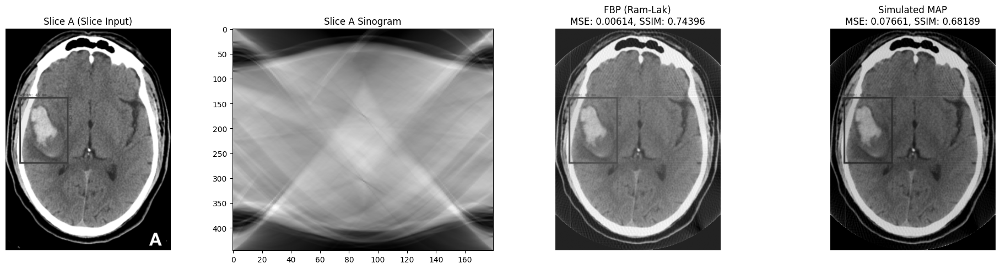

In [15]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x//2 - (target_x//2)
    starty = y//2 - (target_y//2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def statistical_map_reconstruction(sinogram, theta, iterations=10):
    reconstruction = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)

    reconstruction = np.clip(reconstruction, 1e-3, np.max(reconstruction))

    for i in range(iterations):
        proj_estimate = radon(reconstruction, theta=theta, circle=True)

        ratio = sinogram / np.clip(proj_estimate, 1e-3, np.max(proj_estimate))

        correction = iradon(ratio, theta=theta, filter_name=None, circle=True)

        reconstruction *= correction
        reconstruction = np.clip(reconstruction, 0, np.max(reconstruction))

    return reconstruction

def process_slice(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)

    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
    reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)

    reconstruction_map = statistical_map_reconstruction(sinogram, theta, iterations=10)
    reconstruction_map_cropped = center_crop(reconstruction_map, slice_img.shape)

    mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
    ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

    mse_map = mean_squared_error(slice_img, reconstruction_map_cropped)
    ssim_map = ssim(slice_img, reconstruction_map_cropped, data_range=reconstruction_map_cropped.max() - reconstruction_map_cropped.min())

    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - Simulated MAP MSE: {mse_map:.5f}, SSIM: {ssim_map:.5f}")

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    axes[1].imshow(sinogram, cmap='gray', aspect='auto')
    axes[1].set_title(f"{title} Sinogram")

    axes[2].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[2].set_title(f"FBP (Ram-Lak)\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[2].axis('off')

    axes[3].imshow(reconstruction_map_cropped, cmap='gray')
    axes[3].set_title(f"Simulated MAP\nMSE: {mse_map:.5f}, SSIM: {ssim_map:.5f}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

image = imread(workpath +'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice(image_gray, slice_A_coords, "Slice A")

##  Statistical reconstruction using Map with ram filter with 50 iterations

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


Slice A - FBP MSE: 0.00614, SSIM: 0.74396
Slice A - Simulated MAP MSE: 0.07884, SSIM: 0.74968


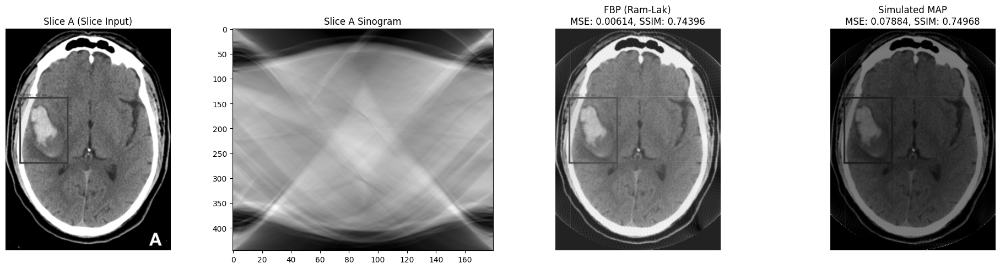

In [16]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x//2 - (target_x//2)
    starty = y//2 - (target_y//2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def statistical_map_reconstruction(sinogram, theta, iterations=50):
    reconstruction = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)

    reconstruction = np.clip(reconstruction, 1e-3, np.max(reconstruction))

    for i in range(iterations):
        proj_estimate = radon(reconstruction, theta=theta, circle=True)

        ratio = sinogram / np.clip(proj_estimate, 1e-3, np.max(proj_estimate))

        correction = iradon(ratio, theta=theta, filter_name=None, circle=True)

        reconstruction *= correction
        reconstruction = np.clip(reconstruction, 0, np.max(reconstruction))

    return reconstruction

def process_slice(image_gray, slice_coords, title):
    slice_img = image_gray[slice_coords[0]:slice_coords[1], slice_coords[2]:slice_coords[3]]
    slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
    slice_img_padded = pad_to_square(slice_img)

    theta = np.linspace(0., 180., 180, endpoint=False)
    sinogram = radon(slice_img_padded, theta=theta, circle=True)

    reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
    reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)

    reconstruction_map = statistical_map_reconstruction(sinogram, theta, iterations=50)
    reconstruction_map_cropped = center_crop(reconstruction_map, slice_img.shape)

    mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
    ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

    mse_map = mean_squared_error(slice_img, reconstruction_map_cropped)
    ssim_map = ssim(slice_img, reconstruction_map_cropped, data_range=reconstruction_map_cropped.max() - reconstruction_map_cropped.min())

    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - Simulated MAP MSE: {mse_map:.5f}, SSIM: {ssim_map:.5f}")

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(slice_img, cmap='gray')
    axes[0].set_title(f"{title} (Slice Input)")
    axes[0].axis('off')

    axes[1].imshow(sinogram, cmap='gray', aspect='auto')
    axes[1].set_title(f"{title} Sinogram")

    axes[2].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[2].set_title(f"FBP (Ram-Lak)\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[2].axis('off')

    axes[3].imshow(reconstruction_map_cropped, cmap='gray')
    axes[3].set_title(f"Simulated MAP\nMSE: {mse_map:.5f}, SSIM: {ssim_map:.5f}")
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

image = imread(workpath +'Data/example_annotated_images.png')
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_B_coords = [2, 890, 848, 1445]
slice_C_coords = [23, 835, 1555, 2230]

process_slice(image_gray, slice_A_coords, "Slice A")

In [17]:
import pandas as pd

results_data = [
    {'Method': 'FBP', 'Iterations': 'N/A', 'Noise Scaling': 'N/A', 'MSE': 0.00614, 'SSIM': 0.74396},
    {'Method': 'Simulated MAP', 'Iterations': 50, 'Noise Scaling': 'N/A', 'MSE': 0.07884, 'SSIM': 0.74968},
    {'Method': 'Simulated MAP', 'Iterations': 10, 'Noise Scaling': 'N/A', 'MSE': 0.07661, 'SSIM': 0.68189},
    {'Method': 'MLEM', 'Iterations': 200, 'Noise Scaling': 'No Noise', 'MSE': 0.00771, 'SSIM': 0.82420},
    {'Method': 'MLEM', 'Iterations': 100, 'Noise Scaling': 50, 'MSE': 0.00777, 'SSIM': 0.78607},
    {'Method': 'MLEM', 'Iterations': 100, 'Noise Scaling': 'No Noise', 'MSE': 0.00733, 'SSIM': 0.81445},
]

df_results = pd.DataFrame(results_data)

print(df_results)


          Method Iterations Noise Scaling      MSE     SSIM
0            FBP        N/A           N/A  0.00614  0.74396
1  Simulated MAP         50           N/A  0.07884  0.74968
2  Simulated MAP         10           N/A  0.07661  0.68189
3           MLEM        200      No Noise  0.00771  0.82420
4           MLEM        100            50  0.00777  0.78607
5           MLEM        100      No Noise  0.00733  0.81445


##  SART (Simultaneous Algebraic Reconstruction Technique) with 20, 100, 200 iterations

/usr/local/lib/python3.12/dist-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


Slice A - FBP MSE: 0.00614, SSIM: 0.74396
Slice A - MLEM MSE: 0.00832, SSIM: 0.79027
Slice A - SART 20 MSE: 0.01073, SSIM: 0.67613
Slice A - SART 100 MSE: 0.01117, SSIM: 0.65040
Slice A - SART 200 MSE: 0.01329, SSIM: 0.59473


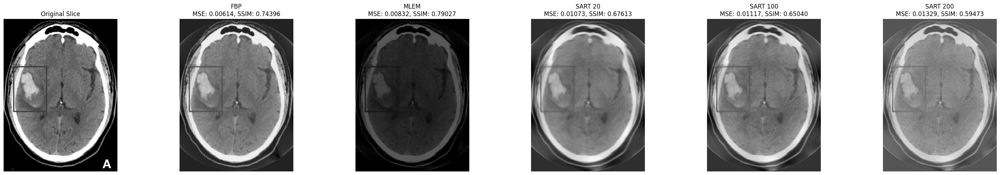

In [18]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import radon, iradon, rescale, iradon_sart
from skimage.metrics import mean_squared_error, structural_similarity as ssim
import numpy as np
import matplotlib.pyplot as plt

def center_crop(image, target_shape):
    y, x = image.shape
    target_y, target_x = target_shape
    startx = x // 2 - (target_x // 2)
    starty = y // 2 - (target_y // 2)
    return image[starty:starty+target_y, startx:startx+target_x]

def pad_to_square(image):
    max_side = max(image.shape)
    pad_y = (max_side - image.shape[0]) // 2
    pad_x = (max_side - image.shape[1]) // 2
    return np.pad(image, ((pad_y, max_side - image.shape[0] - pad_y),
                          (pad_x, max_side - image.shape[1] - pad_x)), mode='reflect')

def sart_reconstruction(sinogram, theta, gt_image, iterations):
    reconstruction_sart = iradon_sart(sinogram, theta=theta)
    for _ in range(iterations - 1):
        reconstruction_sart = iradon_sart(sinogram, theta=theta, image=reconstruction_sart)
    reconstruction_sart_cropped = center_crop(reconstruction_sart, gt_image.shape)
    mse_sart = mean_squared_error(gt_image, reconstruction_sart_cropped)
    ssim_sart = ssim(gt_image, reconstruction_sart_cropped, data_range=reconstruction_sart_cropped.max() - reconstruction_sart_cropped.min())
    return reconstruction_sart_cropped, mse_sart, ssim_sart

def process_slice_prepared(gt_image, title, reconstruction_mlem_cropped, mse_mlem, ssim_mlem,
                           reconstruction_fbp_cropped, mse_fbp, ssim_fbp, sinogram_noisy):
    sart_20, mse_sart_20, ssim_sart_20 = sart_reconstruction(sinogram_noisy, theta, gt_image, iterations=1)
    sart_100, mse_sart_100, ssim_sart_100 = sart_reconstruction(sinogram_noisy, theta, gt_image, iterations=2)
    sart_200, mse_sart_200, ssim_sart_200 = sart_reconstruction(sinogram_noisy, theta, gt_image, iterations=5)

    print(f"{title} - FBP MSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    print(f"{title} - MLEM MSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")
    print(f"{title} - SART 20 MSE: {mse_sart_20:.5f}, SSIM: {ssim_sart_20:.5f}")
    print(f"{title} - SART 100 MSE: {mse_sart_100:.5f}, SSIM: {ssim_sart_100:.5f}")
    print(f"{title} - SART 200 MSE: {mse_sart_200:.5f}, SSIM: {ssim_sart_200:.5f}")

    fig, axes = plt.subplots(1, 6, figsize=(30, 5))
    axes[0].imshow(gt_image, cmap='gray')
    axes[0].set_title("Original Slice")
    axes[0].axis('off')

    axes[1].imshow(reconstruction_fbp_cropped, cmap='gray')
    axes[1].set_title(f"FBP\nMSE: {mse_fbp:.5f}, SSIM: {ssim_fbp:.5f}")
    axes[1].axis('off')

    axes[2].imshow(reconstruction_mlem_cropped, cmap='gray')
    axes[2].set_title(f"MLEM\nMSE: {mse_mlem:.5f}, SSIM: {ssim_mlem:.5f}")
    axes[2].axis('off')

    axes[3].imshow(sart_20, cmap='gray')
    axes[3].set_title(f"SART 20\nMSE: {mse_sart_20:.5f}, SSIM: {ssim_sart_20:.5f}")
    axes[3].axis('off')

    axes[4].imshow(sart_100, cmap='gray')
    axes[4].set_title(f"SART 100\nMSE: {mse_sart_100:.5f}, SSIM: {ssim_sart_100:.5f}")
    axes[4].axis('off')

    axes[5].imshow(sart_200, cmap='gray')
    axes[5].set_title(f"SART 200\nMSE: {mse_sart_200:.5f}, SSIM: {ssim_sart_200:.5f}")
    axes[5].axis('off')

    plt.tight_layout()
    plt.show()

image = imread(workpath + "Data/example_annotated_images.png")
if image.shape[-1] == 4:
    image = image[:, :, :3]
image_gray = rgb2gray(image)

slice_A_coords = [2, 960, 63, 725]
slice_img = image_gray[slice_A_coords[0]:slice_A_coords[1], slice_A_coords[2]:slice_A_coords[3]]
slice_img = rescale(slice_img, 0.5, mode='reflect', channel_axis=None)
slice_img_padded = pad_to_square(slice_img)
theta = np.linspace(0., 180., 180, endpoint=False)
sinogram = radon(slice_img_padded, theta=theta, circle=True)

scaling_factor = 100
sinogram_noisy = np.random.poisson(sinogram * scaling_factor) / scaling_factor

reconstruction_fbp = iradon(sinogram, theta=theta, filter_name='ramp', circle=True)
reconstruction_fbp_cropped = center_crop(reconstruction_fbp, slice_img.shape)
mse_fbp = mean_squared_error(slice_img, reconstruction_fbp_cropped)
ssim_fbp = ssim(slice_img, reconstruction_fbp_cropped, data_range=reconstruction_fbp_cropped.max() - reconstruction_fbp_cropped.min())

def mlem_reconstruction(sinogram, theta, iterations=20):
    image_size = sinogram.shape[0]
    reconstructed = np.ones((image_size, image_size), dtype=np.float32)
    ones_sino = radon(np.ones_like(reconstructed), theta=theta, circle=True)
    for _ in range(iterations):
        estimate_proj = radon(reconstructed, theta=theta, circle=True)
        ratio = np.divide(sinogram, estimate_proj + 1e-6)
        correction = iradon(ratio, theta=theta, filter_name=None, circle=True, output_size=image_size)
        correction_norm = iradon(ones_sino * 0 + 1, theta=theta, filter_name=None, circle=True, output_size=image_size)
        reconstructed *= correction / (correction_norm + 1e-6)
    return reconstructed

reconstruction_mlem = mlem_reconstruction(sinogram_noisy, theta, iterations=200)
reconstruction_mlem_cropped = center_crop(reconstruction_mlem, slice_img.shape)
mse_mlem = mean_squared_error(slice_img, reconstruction_mlem_cropped)
ssim_mlem = ssim(slice_img, reconstruction_mlem_cropped, data_range=reconstruction_mlem_cropped.max() - reconstruction_mlem_cropped.min())

process_slice_prepared(slice_img, "Slice A",
                       reconstruction_mlem_cropped, mse_mlem, ssim_mlem,
                       reconstruction_fbp_cropped, mse_fbp, ssim_fbp,
                       sinogram_noisy)
